In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from collections import Counter
import tensorflow as tf
from tensorflow.keras.layers import  Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import backend as K
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve , precision_recall_curve, average_precision_score


2025-12-17 21:03:45.059636: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766005425.275496      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766005425.333366      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [2]:
train_images_path = "/kaggle/input/retina-blood-vessel/Data/train/image"
train_masks_path  = "/kaggle/input/retina-blood-vessel/Data/train/mask"
test_images_path = "/kaggle/input/retina-blood-vessel/Data/test/image"
test_masks_path  = "/kaggle/input/retina-blood-vessel/Data/test/mask"

## Load Data

In [3]:
train_images = []
train_masks  = []
test_images = []
test_masks  = []

train_image_names = []
train_mask_names  = []

In [4]:
# 1) Load images and masks train
# ================================
for img_name, mask_name in zip(
        sorted(os.listdir(train_images_path)),
        sorted(os.listdir(train_masks_path))):

    img_path  = os.path.join(train_images_path, img_name)
    mask_path = os.path.join(train_masks_path, mask_name)

    img  = cv2.imread(img_path, cv2.IMREAD_COLOR)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    train_images.append(img)
    train_masks.append(mask)

    train_image_names.append(img_name)
    train_mask_names.append(mask_name)

In [5]:
# 2) Load images and masks test
# ================================
for img_name, mask_name in zip(
            sorted(os.listdir(test_images_path)),
            sorted(os.listdir(test_masks_path))):
    
    img_path  = os.path.join(train_images_path, img_name)
    mask_path = os.path.join(train_masks_path, mask_name)

    img  = cv2.imread(img_path, cv2.IMREAD_COLOR)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    test_images.append(img)
    test_masks.append(mask)

## Numerical Analysis

In [6]:
# 3) Dataset Statistics
# ================================
def dataset_statistics(images, masks):

    dimensions = Counter()
    mask_dimensions = Counter()
    mask_unique_values = set()

    for img, mask in zip(images, masks):

        # Image properties
        h, w, c = img.shape
        dimensions[(h, w)] += 1

        # Mask properties
        mh, mw = mask.shape
        mask_dimensions[(mh, mw)] += 1

        # Unique values in masks
        mask_unique_values.update(np.unique(mask).tolist())

    # ===== Display (Same as original) =====
    print("Image Dimensions:")
    for dim, count in dimensions.items():
        print(f"  {dim}: {count} files")
    print("--------------------------------------")

    print("Mask Dimensions:")
    for dim, count in mask_dimensions.items():
        print(f"  {dim}: {count} files")
    print("--------------------------------------")

    print(f"Unique mask pixel values: {sorted(mask_unique_values)}")


In [7]:
dataset_statistics(train_images,train_masks)

Image Dimensions:
  (512, 512): 80 files
--------------------------------------
Mask Dimensions:
  (512, 512): 80 files
--------------------------------------
Unique mask pixel values: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,

In [8]:
dataset_statistics(test_images,test_masks)

Image Dimensions:
  (512, 512): 20 files
--------------------------------------
Mask Dimensions:
  (512, 512): 20 files
--------------------------------------
Unique mask pixel values: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,

In [9]:
# 4) Analysis 
# ===============
def sharpness(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def estimate_noise(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return np.std(gray)

def brightness(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return np.mean(gray)

def channel_means(image):
        return {"Blue": np.mean(image[:,:,0]), "Green": np.mean(image[:,:,1]), "Red": np.mean(image[:,:,2])}

def mask_foreground_ratio(mask):
        return np.sum(mask>0)/mask.size

In [10]:
data = []

for img, mask, img_name, mask_name in zip(
        train_images, train_masks, train_image_names, train_mask_names):

    stats = {
        "image": img_name,
        "mask": mask_name,
        "sharpness": sharpness(img),
        "noise": estimate_noise(img),
        "brightness": brightness(img),
        "channel_means": channel_means(img),
        "mask_foreground_ratio": mask_foreground_ratio(mask)
    }

    data.append(stats)
# Convert to DataFrame
# ================================
data = pd.DataFrame(data)

# Expand channel_means dict into separate columns
channel_df = pd.json_normalize(data['channel_means'])
data = pd.concat([data.drop(columns=['channel_means']), channel_df], axis=1)

data

,image,mask,sharpness,noise,brightness,mask_foreground_ratio,Blue,Green,Red
0,0.png,0.png,62.825591,62.556021,96.169468,0.105225,54.262920,82.663132,138.607224
1,1.png,1.png,62.825591,62.556021,96.169468,0.105225,54.262920,82.663132,138.607224
2,10.png,10.png,67.665466,68.667963,105.857807,0.088673,44.629650,83.650169,172.772694
3,11.png,11.png,66.789329,63.753204,117.472221,0.096264,49.451675,93.362934,190.735798
4,12.png,12.png,81.795362,65.848718,102.706238,0.159134,47.641083,83.577709,161.191837
...,...,...,...,...,...,...,...,...,...
75,77.png,77.png,33.204201,38.900646,60.982502,0.107090,28.867973,51.756020,91.290901
76,78.png,78.png,33.204201,38.900646,60.982502,0.107090,28.867973,51.756020,91.290901
77,79.png,79.png,25.959572,34.396149,68.838032,0.131512,32.278511,58.443024,103.162952
78,8.png,8.png,67.665466,68.667963,105.857807,0.088673,44.629650,83.650169,172.772694


## Visualize Analysis

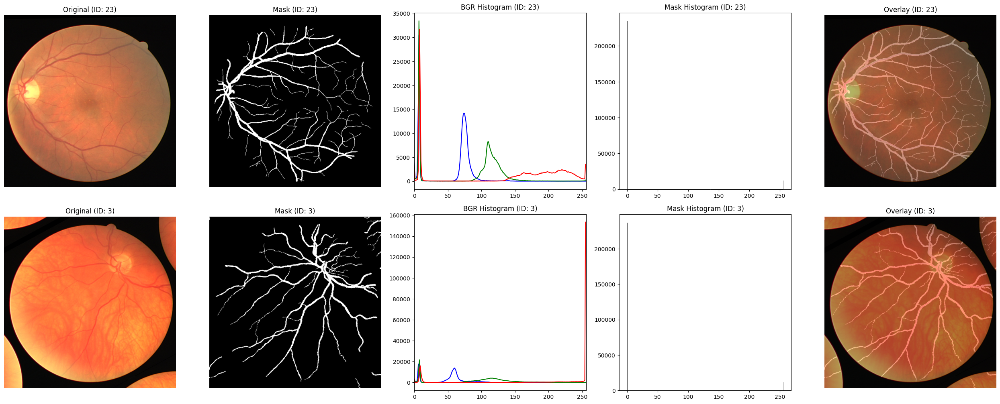

In [11]:
# 5) Histogram & Overlay
# ==========================
indices = random.sample(range(len(train_images)), 2)
fig, axes = plt.subplots(2, 5, figsize=(25, 10))
colors = ('b','g','r')

for row, idx in enumerate(indices):
    img = train_images[idx]
    mask = train_masks[idx]
    img_num = idx

   # 1) Original
   # ======================
    axes[row,0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[row,0].set_title(f"Original (ID: {img_num})")
    axes[row,0].axis('off')
    
   # 2) Mask
   # ======================
    axes[row,1].imshow(mask, cmap='gray')
    axes[row,1].set_title(f"Mask (ID: {img_num})")
    axes[row,1].axis('off')
    
   # 3) Histogram BGR
  # ======================
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img],[i],None,[256],[0,256])
        axes[row,2].plot(hist, color=col)
    axes[row,2].set_xlim([0,256])
    axes[row,2].set_title(f"BGR Histogram (ID: {img_num})")
    
   # 4) Histogram Mask
  # ======================
    axes[row,3].hist(mask.ravel(), bins=256, range=(0,256), color='gray')
    axes[row,3].set_title(f"Mask Histogram (ID: {img_num})")
    
   # 5) Overlay
 # ======================
    overlay = cv2.addWeighted(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), 0.7,
                              cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB), 0.3, 0)
    axes[row,4].imshow(overlay)
    axes[row,4].set_title(f"Overlay (ID: {img_num})")
    axes[row,4].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.98)
plt.show()

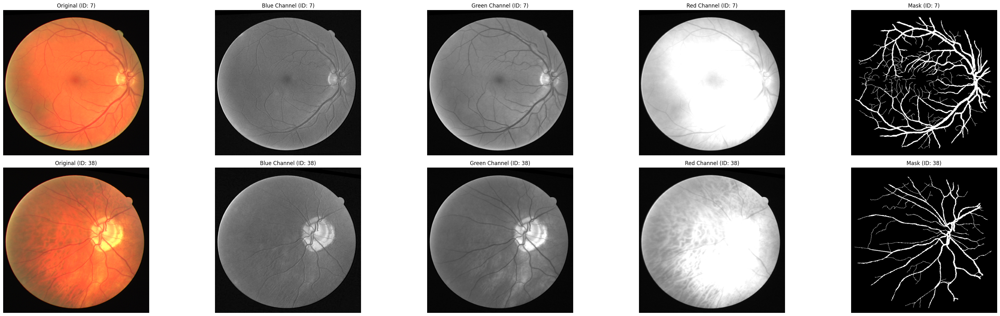

In [12]:
# 6) Show each channel
#===========================
indices = random.sample(range(len(train_images)), 2)
fig, axes = plt.subplots(2, 5, figsize=(35, 10))

for row, idx in enumerate(indices):
    img = train_images[idx]
    mask = train_masks[idx]
    img_num = idx

    # 1) Original Image (RGB)
    # ======================
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[row, 0].imshow(img_rgb)
    axes[row, 0].set_title(f"Original (ID: {img_num})")
    axes[row, 0].axis('off')

    # 2) Blue, Green, Red Channels
    # ======================
    channel_names = ['Blue', 'Green', 'Red']
    for i in range(3):
        axes[row, i + 1].imshow(img[:, :, i], cmap='gray')
        axes[row, i + 1].set_title(f"{channel_names[i]} Channel (ID: {img_num})")
        axes[row, i + 1].axis('off')

    # 3) Mask
    # ======================
    axes[row, 4].imshow(mask, cmap='gray')
    axes[row, 4].set_title(f"Mask (ID: {img_num})")
    axes[row, 4].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.98)
plt.show()


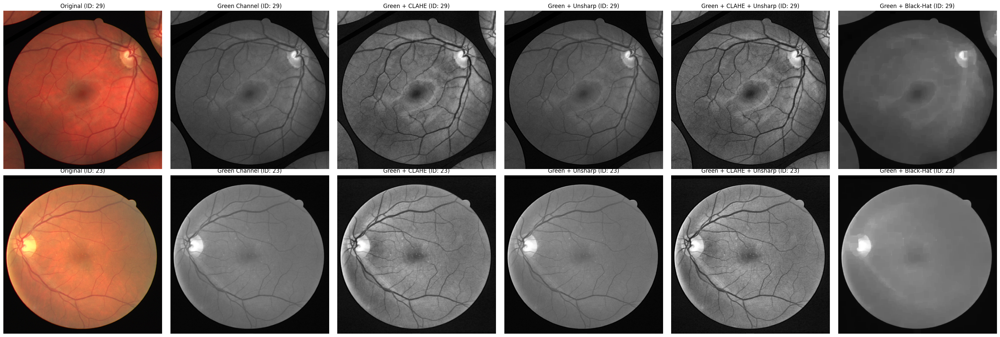

In [13]:
# 7) Green Channel Enhancements
# ================================
indices = random.sample(range(len(train_images)), 2)
fig, axes = plt.subplots(2, 6, figsize=(30, 10))

# CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

for row, idx in enumerate(indices):
    img = train_images[idx]
    img_num = idx

    # 1) Original Image (RGB)
    # ======================
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[row, 0].imshow(img_rgb)
    axes[row, 0].set_title(f"Original (ID: {img_num})")
    axes[row, 0].axis('off')

    # 2) Green Channel
    # ======================
    green = img[:, :, 1]
    axes[row, 1].imshow(green, cmap='gray')
    axes[row, 1].set_title(f"Green Channel (ID: {img_num})")
    axes[row, 1].axis('off')

    # 3) Green + CLAHE
    # ======================
    green_clahe = clahe.apply(green)
    axes[row, 2].imshow(green_clahe, cmap='gray')
    axes[row, 2].set_title(f"Green + CLAHE (ID: {img_num})")
    axes[row, 2].axis('off')

    # 4) Green + Unsharp
    # ======================
    blurred = cv2.GaussianBlur(green, (5, 5), 0)
    unsharp = cv2.addWeighted(green, 1.5, blurred, -0.5, 0)
    axes[row, 3].imshow(unsharp, cmap='gray')
    axes[row, 3].set_title(f"Green + Unsharp (ID: {img_num})")
    axes[row, 3].axis('off')

    # 5) Green + CLAHE + Unsharp
    # ======================
    blurred_clahe = cv2.GaussianBlur(green_clahe, (5, 5), 0)
    green_clahe_unsharp = cv2.addWeighted(green_clahe, 1.5, blurred_clahe, -0.5, 0)
    axes[row, 4].imshow(green_clahe_unsharp, cmap='gray')
    axes[row, 4].set_title(f"Green + CLAHE + Unsharp (ID: {img_num})")
    axes[row, 4].axis('off')

    # 6) Green + Black-Hat Enhanced
    # ======================
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    blackhat = cv2.morphologyEx(green, cv2.MORPH_BLACKHAT, kernel)
    blackhat_enhanced = cv2.add(green, blackhat)
    axes[row, 5].imshow(blackhat_enhanced, cmap='gray')
    axes[row, 5].set_title(f"Green + Black-Hat (ID: {img_num})")
    axes[row, 5].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.98)
plt.show()


## Preprocessing

In [14]:
# 9) Processing
# ================================
def preprocess_image(img):

    # Convert BGR → RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Green channel
    G = img[:, :, 1]

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    G_clahe = clahe.apply(G)

    # Unsharp Mask
    blur = cv2.GaussianBlur(G_clahe, (0, 0), sigmaX=3)
    unsharp = cv2.addWeighted(G_clahe, 1.5, blur, -0.5, 0)

    # Normalize to [0,1]
    processed = unsharp.astype(np.float32) / 255.0

    # Add channel dimension for model input
    processed = np.expand_dims(processed, axis=-1)
    return processed


def preprocess_mask(mask):
    mask_bin = (mask > 0).astype(np.uint8)
    mask_bin = np.expand_dims(mask_bin, axis=-1)
    return mask_bin


In [15]:
train_images_processed = []
train_masks_processed  = []

for ( img), (mask) in zip(train_images, train_masks):

    img_proc = preprocess_image(img)
    mask_proc = preprocess_mask(mask)

    train_images_processed.append(img_proc)
    train_masks_processed.append(mask_proc)

print(f"Processed_image: {len(train_images_processed)}")
print(f"Processed_mask: {len(train_masks_processed)}")

Processed_image: 80
Processed_mask: 80


In [16]:
test_images_processed = []
test_masks_processed  = []

for ( img), (mask) in zip(test_images, test_masks):

    img_proc = preprocess_image(img)
    mask_proc = preprocess_mask(mask)

    test_images_processed.append(img_proc)
    test_masks_processed.append(mask_proc)

print(f"Processed_image: {len(test_images_processed)}")
print(f"Processed_mask: {len(test_masks_processed)}")

Processed_image: 20
Processed_mask: 20


## Augmentation

In [17]:
# 10) augmentation
# ================================
def augmentation(img, mask):

    img = img.copy()
    mask = mask.copy()

    img = img[:, :, 0]
    mask = mask[:, :, 0]

    h, w = img.shape
    augmented_images = []
    augmented_masks = []

    # a) RANDOM ROTATION 
    # ======================
    angle = random.randint(-15, 15)
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    img_rotation = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
    mask_rotation = cv2.warpAffine(mask, M, (w, h), flags=cv2.INTER_NEAREST, borderMode=cv2.BORDER_REFLECT)

    augmented_images.append(np.expand_dims(img_rotation, axis=-1))
    augmented_masks.append(np.expand_dims((mask_rotation>0.5).astype(np.uint8), axis=-1))

    # b) RANDOM FLIP 
    # ======================
    img_flip = img.copy()
    mask_flip = mask.copy()
    if random.random() > 0.5:
        img_flip = cv2.flip(img_flip, 1)
        mask_flip = cv2.flip(mask_flip, 1)
    if random.random() > 0.5:
        img_flip = cv2.flip(img_flip, 0)
        mask_flip = cv2.flip(mask_flip, 0)

    augmented_images.append(np.expand_dims(img_flip, axis=-1))
    augmented_masks.append(np.expand_dims((mask_flip>0.5).astype(np.uint8), axis=-1))

    # c) RANDOM ZOOM 
    # ======================
    zoom = 1 + (random.random() - 0.5) * 0.2  # 0.9 to 1.1
    M_zoom = cv2.getRotationMatrix2D((w//2, h//2), 0, zoom)
    img_zoom = cv2.warpAffine(img, M_zoom, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
    mask_zoom = cv2.warpAffine(mask, M_zoom, (w, h), flags=cv2.INTER_NEAREST, borderMode=cv2.BORDER_REFLECT)

    augmented_images.append(np.expand_dims(img_zoom, axis=-1))
    augmented_masks.append(np.expand_dims((mask_zoom>0.5).astype(np.uint8), axis=-1))

    # d) RANDOM SHIFT 
    # ======================
    max_shift = 0.1
    tx = int((random.random() - 0.5) * 2 * max_shift * w)
    ty = int((random.random() - 0.5) * 2 * max_shift * h)
    M_shift = np.float32([[1,0,tx],[0,1,ty]])
    img_shift = cv2.warpAffine(img, M_shift, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
    mask_shift = cv2.warpAffine(mask, M_shift, (w, h), flags=cv2.INTER_NEAREST, borderMode=cv2.BORDER_REFLECT)

    augmented_images.append(np.expand_dims(img_shift, axis=-1))
    augmented_masks.append(np.expand_dims((mask_shift>0.5).astype(np.uint8), axis=-1))

    return    augmented_images, augmented_masks 

In [18]:
augmented_images_all = []
augmented_masks_all = []

for i in range(len(train_images_processed)):
    img = train_images_processed[i]  
    mask = train_masks_processed[i]

    augmented_images_all.append(np.expand_dims(img, axis=-1).astype(np.float32))
    augmented_masks_all.append(np.expand_dims((mask>0.5).astype(np.uint8), axis=-1))
    
    aug_imgs, aug_masks = augmentation(img, mask)
    
    augmented_images_all.extend(aug_imgs)
    augmented_masks_all.extend(aug_masks)

print("Total augmented images:", len(augmented_images_all))
print("Total augmented masks:", len(augmented_masks_all))



Total augmented images: 400
Total augmented masks: 400


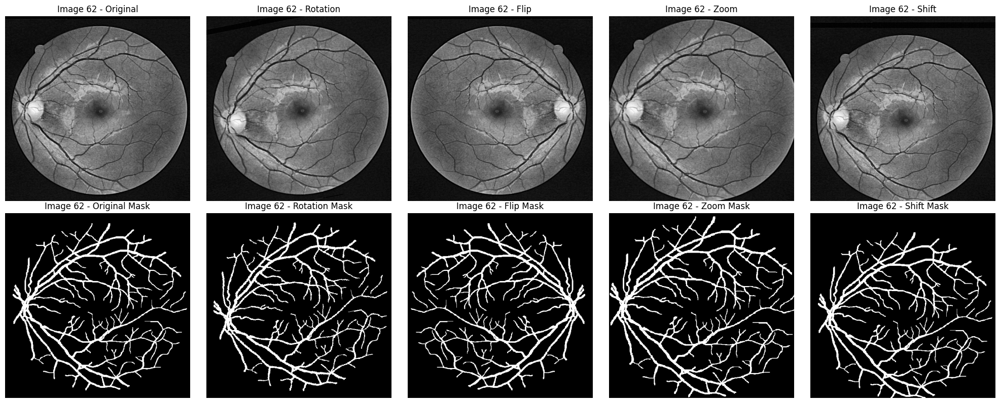

In [44]:
# 13) Visualization augmentation
# ================================
group_size = 5  
num_groups = len(augmented_images_all) // group_size

group_idx = random.randint(0, num_groups-1)
start_idx = group_idx * group_size

aug_names = ["Original", "Rotation", "Flip", "Zoom", "Shift"]

display_imgs = [augmented_images_all[start_idx + i][:,:,0] for i in range(group_size)]
display_masks = [augmented_masks_all[start_idx + i][:,:,0] for i in range(group_size)]

fig, axes = plt.subplots(2, group_size, figsize=(4*group_size, 8))

for i in range(group_size):
    axes[0,i].imshow(display_imgs[i], cmap='gray')
    axes[0,i].set_title(f'Image {group_idx} - {aug_names[i]}')
    axes[0,i].axis('off')

    axes[1,i].imshow(display_masks[i], cmap='gray')
    axes[1,i].set_title(f'Image {group_idx} - {aug_names[i]} Mask')
    axes[1,i].axis('off')

plt.tight_layout()
plt.show()

In [19]:
# 11) generator
# ================================
def data_generator(images, masks, batch_size=8, augment=False):
    while True:
        idx = np.random.permutation(len(images))
        images = images[idx]
        masks = masks[idx]

        for i in range(0, len(images), batch_size):
            batch_imgs = []
            batch_masks = []

            for j in range(i, min(i + batch_size, len(images))):
                img = images[j]
                mask = masks[j]

                if augment:
                    imgs_aug, masks_aug = augmentation(img.copy(), mask.copy())
                    batch_imgs.extend(imgs_aug)
                    batch_masks.extend(masks_aug)
                else:
                    batch_imgs.append(img)
                    batch_masks.append(mask)

            yield np.array(batch_imgs, dtype=np.float32), np.array(batch_masks, dtype=np.float32)


In [20]:
train_images_processed = np.array(train_images_processed)
train_masks_processed = np.array(train_masks_processed)

test_images_processed = np.array(test_images_processed)
test_masks_processed = np.array(test_masks_processed)

In [21]:
train_gen = data_generator(train_images_processed, train_masks_processed, batch_size=2, augment=True)
val_gen = data_generator(test_images_processed, test_masks_processed, batch_size=2, augment=False)

In [22]:
test_images_processed.shape

(20, 512, 512, 1)

## Model

In [23]:
#12) Model
# ================================
def unet_model(input_shape=(512, 512, 1)):

    inputs = Input(input_shape)

    # a) Encoder
    # ==============
    c1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, 3, activation='relu', padding='same')(c1)
    p1 = MaxPooling2D()(c1)

    c2 = Conv2D(128, 3, activation='relu', padding='same')(p1)
    c2 = Conv2D(128, 3, activation='relu', padding='same')(c2)
    p2 = MaxPooling2D()(c2)

    c3 = Conv2D(256, 3, activation='relu', padding='same')(p2)
    c3 = Conv2D(256, 3, activation='relu', padding='same')(c3)
    p3 = MaxPooling2D()(c3)

    c4 = Conv2D(512, 3, activation='relu', padding='same')(p3)
    c4 = Conv2D(512, 3, activation='relu', padding='same')(c4)
    p4 = MaxPooling2D()(c4)

    # b) Bottleneck
    # ==============
    c5 = Conv2D(1024, 3, activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, 3, activation='relu', padding='same')(c5)

    # c) Decoder
    # ==============
    u6 = UpSampling2D()(c5)
    u6 = Concatenate()([u6, c4])
    c6 = Conv2D(512, 3, activation='relu', padding='same')(u6)
    c6 = Conv2D(512, 3, activation='relu', padding='same')(c6)

    u7 = UpSampling2D()(c6)
    u7 = Concatenate()([u7, c3])
    c7 = Conv2D(256, 3, activation='relu', padding='same')(u7)
    c7 = Conv2D(256, 3, activation='relu', padding='same')(c7)

    u8 = UpSampling2D()(c7)
    u8 = Concatenate()([u8, c2])
    c8 = Conv2D(128, 3, activation='relu', padding='same')(u8)
    c8 = Conv2D(128, 3, activation='relu', padding='same')(c8)

    u9 = UpSampling2D()(c8)
    u9 = Concatenate()([u9, c1])
    c9 = Conv2D(64, 3, activation='relu', padding='same')(u9)
    c9 = Conv2D(64, 3, activation='relu', padding='same')(c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs, outputs)
    return model
    
print ("done")

done


In [24]:
model = unet_model()

I0000 00:00:1766005454.074962      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [25]:
# 13) Loss Function : Focal Tversky
# =============================================
def tversky_index(y_true, y_pred, alpha=0.3, beta=0.7, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    TP = K.sum(y_true_f * y_pred_f)
    FP = K.sum((1 - y_true_f) * y_pred_f)
    FN = K.sum(y_true_f * (1 - y_pred_f))

    return (TP + smooth) / (TP + alpha * FP + beta * FN + smooth)

def focal_tversky_loss_alpha_beta(alpha=0.3, beta=0.7, gamma=0.75):
    def loss(y_true, y_pred):
        tv = tversky_index(y_true, y_pred, alpha=alpha, beta=beta)
        return K.pow((1 - tv), gamma)
    return loss

In [26]:
# 14) Optional metrics (Dice + IoU)
# ===========================================
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.cast(K.flatten(y_true), "float32")
    y_pred_f = tf.cast(K.flatten(y_pred), "float32")
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def iou_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.cast(K.flatten(y_true), 'float32')
    y_pred_f = tf.cast(K.flatten(y_pred), 'float32')
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

In [27]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=focal_tversky_loss_alpha_beta(alpha=0.3, beta=0.7, gamma=0.75),
    metrics=[dice_coef, iou_coef, "accuracy"]
)

In [28]:
# 15) Callbacks 
# ======================
checkpoint = ModelCheckpoint(
    "best_model.keras",
    monitor="val_dice_coef",
    save_best_only=True,
    mode="max",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_dice_coef',
    factor=0.5,
    patience=20,
    verbose=1,
    mode='max',
    min_lr=1e-7
)


In [29]:
# 16) Training
# ======================
history = model.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=len(train_images_processed)//2,
    validation_steps=len(test_images_processed)//2,
    epochs=100,
    callbacks=[checkpoint, reduce_lr]
)

Epoch 1/100


I0000 00:00:1766005461.606693     114 service.cc:148] XLA service 0x793710026910 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1766005461.607614     114 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1766005462.501740     114 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1766005528.178876     114 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 780ms/step - accuracy: 0.1300 - dice_coef: 0.2189 - iou_coef: 0.1231 - loss: 0.7636
Epoch 1: val_dice_coef improved from -inf to 0.26846, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.1308 - dice_coef: 0.2192 - iou_coef: 0.1233 - loss: 0.7630 - val_accuracy: 0.4439 - val_dice_coef: 0.2685 - val_iou_coef: 0.1553 - val_loss: 0.6999 - learning_rate: 1.0000e-04
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 780ms/step - accuracy: 0.4236 - dice_coef: 0.2701 - iou_coef: 0.1571 - loss: 0.7041
Epoch 2: val_dice_coef improved from 0.26846 to 0.31328, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 34s 840ms/step - accuracy: 0.4235 - dice_coef: 0.2703 - iou_coef: 0.1572 - loss: 0.7038 - val_accuracy: 0.4697 - val_dice_coef: 0.3133 - val_iou_coef: 0.1862 - val_loss: 0.6571 - learning_rate: 1.0000e-04
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 783ms/step - accuracy: 0.4919 - dice_coef: 0.3085 - iou_coef: 0.1826 - loss: 0.

In [30]:
hist = history.history

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


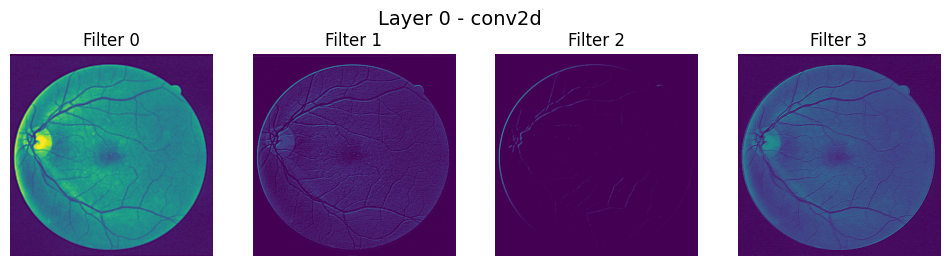

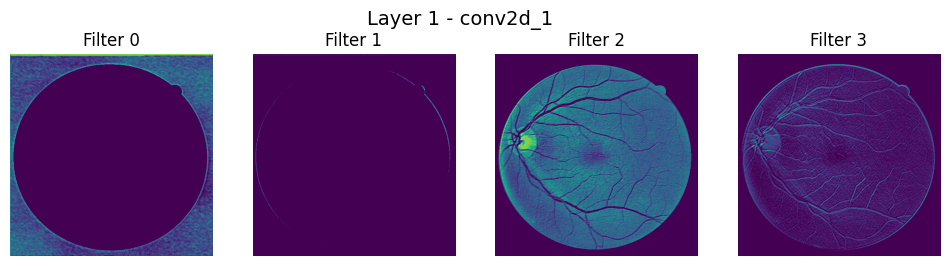

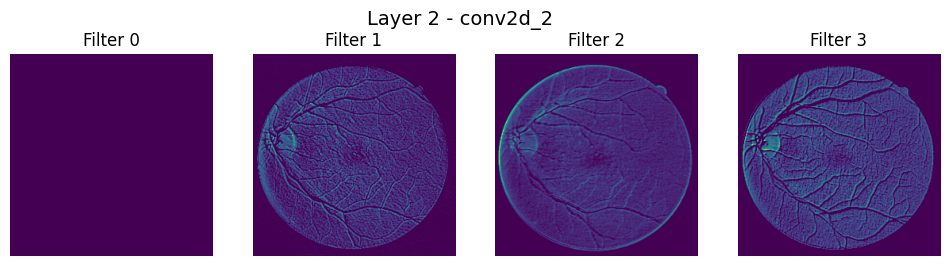

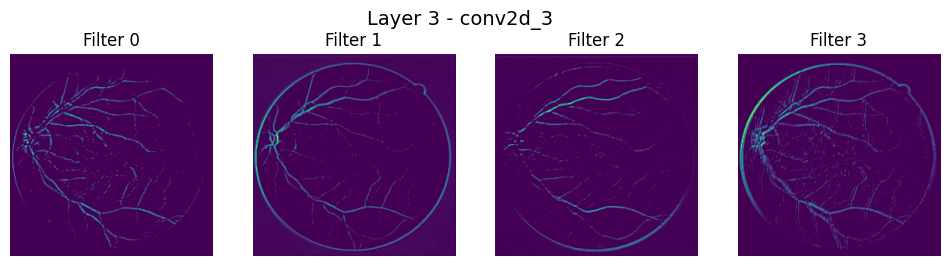

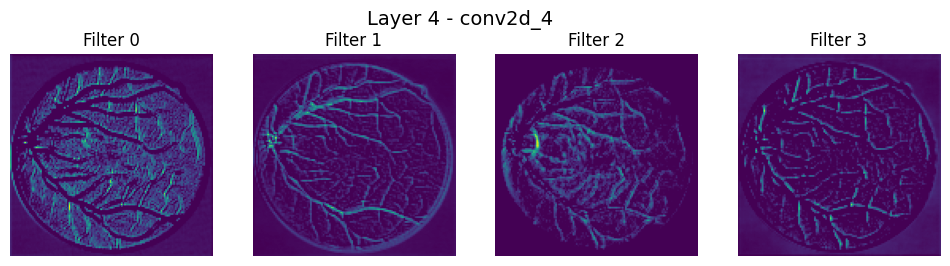

...

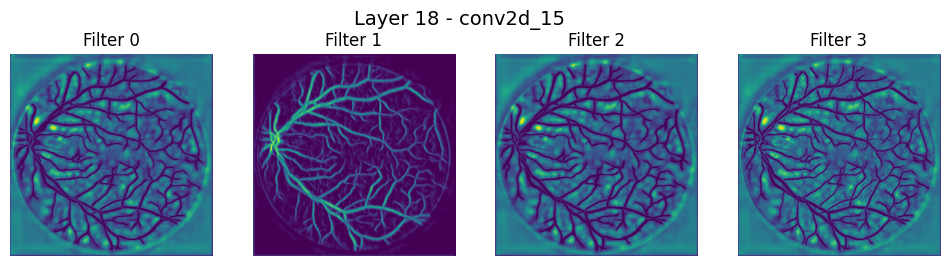

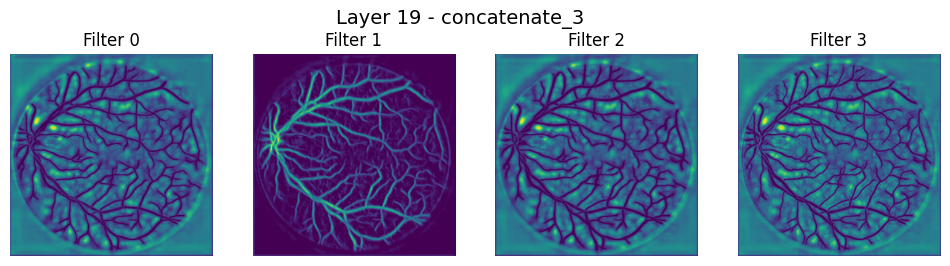

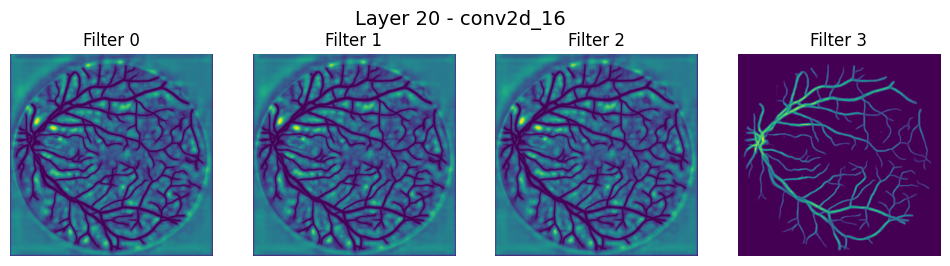

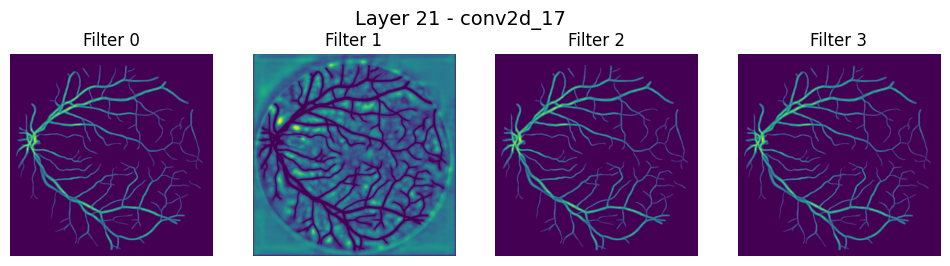

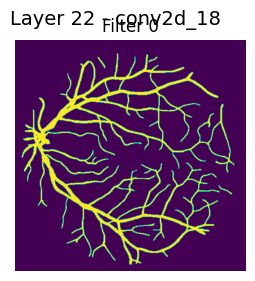

In [46]:
layers_to_inspect = [layer.name for layer in model.layers if 'conv2d' in layer.name or 'concatenate' in layer.name]
layer_outputs = [layer.output for layer in model.layers if layer.name in layers_to_inspect]
feature_map_model = Model(inputs=model.input, outputs=layer_outputs)


img = np.expand_dims(test_images_processed[0], axis=0)  
feature_maps = feature_map_model.predict(img)

for layer_idx, fmap in enumerate(feature_maps):
    fmap = fmap[0]  
    num_filters = fmap.shape[-1]
    num_to_show = min(4, num_filters)  

    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Layer {layer_idx} - {layers_to_inspect[layer_idx]}", fontsize=14)
    
    for i in range(num_to_show):
        plt.subplot(1, num_to_show, i+1)
        plt.imshow(fmap[:, :, i], cmap='viridis')
        plt.axis('off')
        plt.title(f"Filter {i}")
    plt.show()

## Evalution

In [31]:
# 17) Print final values
# ===============================
final_epoch = -1  
print("========= FINAL METRICS =========")
print("Training Accuracy   :", history.history['accuracy'][final_epoch])
print("Training Loss       :", history.history['loss'][final_epoch])
print("Training Dice       :", history.history['dice_coef'][final_epoch])
print("Training IoU        :", history.history['iou_coef'][final_epoch])
print("Validation Accuracy :", history.history['val_accuracy'][final_epoch])
print("Validation Loss     :", history.history['val_loss'][final_epoch])
print("Validation Dice     :", history.history['val_dice_coef'][final_epoch])
print("Validation IoU      :", history.history['val_iou_coef'][final_epoch])
print("=================================")


========= FINAL METRICS =========
Training Accuracy   : 0.964989185333252
Training Loss       : 0.1862311065196991
Training Dice       : 0.8679362535476685
Training IoU        : 0.7668653130531311
Validation Accuracy : 0.9713550806045532
Validation Loss     : 0.1645531803369522
Validation Dice     : 0.892901599407196
Validation IoU      : 0.8066002130508423


### Confusion Matrix & ROC & PR

In [47]:
y_true = test_masks_processed.flatten()
y_pred_probs = model.predict(test_images_processed)  
y_pred = (y_pred_probs > 0.5).astype(np.uint8).flatten() 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


In [33]:
# 18) Precision, Recall, F1-score, AUC
#=================================================
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
auc = roc_auc_score(y_true, y_pred_probs.flatten())  

print("========= CLASSIFICATION METRICS =========")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")
print(f"AUC       : {auc:.4f}")
print("==========================================")

========= CLASSIFICATION METRICS =========
Precision : 0.8525
Recall    : 0.9366
F1-score  : 0.8926
AUC       : 0.9853


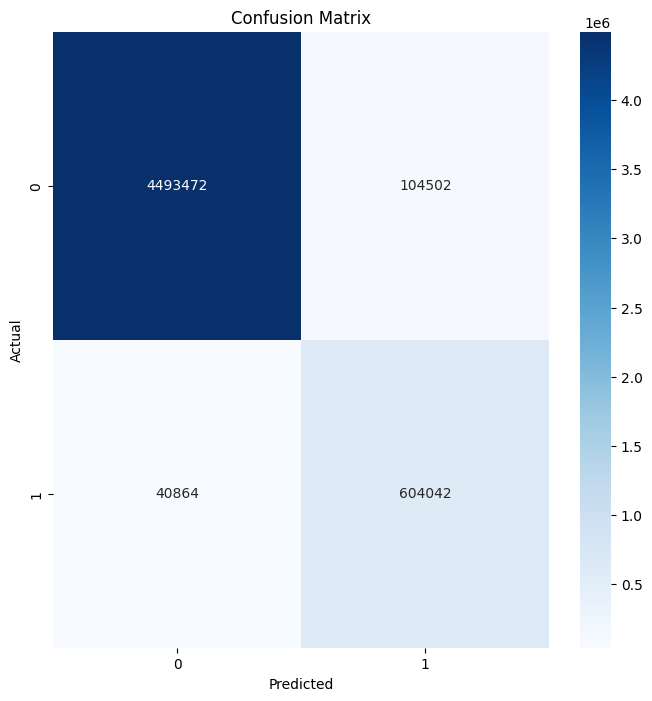

In [36]:
# 19) Confusion Matrix
#========================
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=True)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


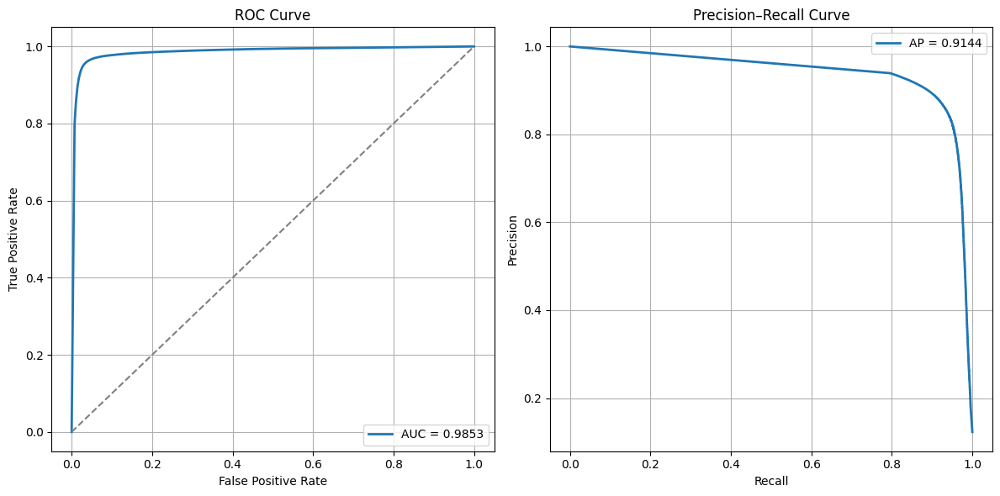

In [42]:
# ROC
#=======
fpr, tpr, _ = roc_curve(y_true, y_pred_probs.flatten())
roc_auc = roc_auc_score(y_true, y_pred_probs.flatten())

# Precision - Recall 
#======================
precision_curve, recall_curve, _ = precision_recall_curve(
    y_true, y_pred_probs.flatten()
)
ap_score = average_precision_score(y_true, y_pred_probs.flatten())

plt.figure(figsize=(12, 6))

# ROC Curve 
#==============
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, linewidth=2, label=f"AUC = {roc_auc:.4f}")
plt.plot([0,1],[0,1],'--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)

# Precision–Recall Curve
#============================
plt.subplot(1, 2, 2)
plt.plot(recall_curve, precision_curve, linewidth=2, label=f"AP = {ap_score:.4f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


### Accuracy & Loss

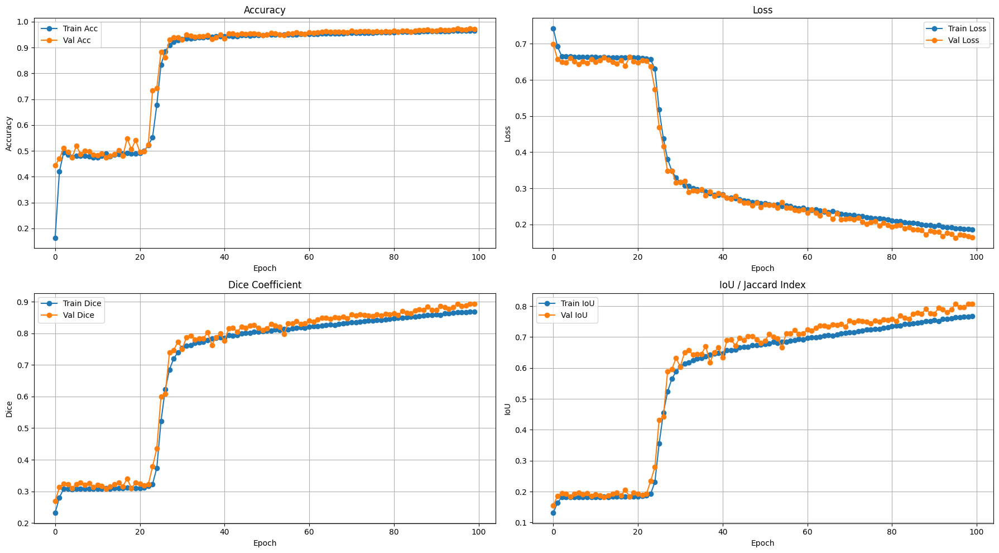

In [38]:
# 21) Accuracy & Loss & Dice & IoU
# ==================================
plt.figure(figsize=(18,10))

# Accuracy
#=============
plt.subplot(2,2,1)
plt.plot(history.history['accuracy'], label='Train Acc', marker='o')
plt.plot(history.history['val_accuracy'], label='Val Acc', marker='o')
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

# Loss
#=========
plt.subplot(2,2,2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

# Dice
#=========
plt.subplot(2,2,3)
plt.plot(history.history['dice_coef'], label='Train Dice', marker='o')
plt.plot(history.history['val_dice_coef'], label='Val Dice', marker='o')
plt.title("Dice Coefficient")
plt.xlabel("Epoch")
plt.ylabel("Dice")
plt.legend()
plt.grid(True)

# IoU
#========
plt.subplot(2,2,4)
plt.plot(history.history['iou_coef'], label='Train IoU', marker='o')
plt.plot(history.history['val_iou_coef'], label='Val IoU', marker='o')
plt.title("IoU / Jaccard Index")
plt.xlabel("Epoch")
plt.ylabel("IoU")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Visualize

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


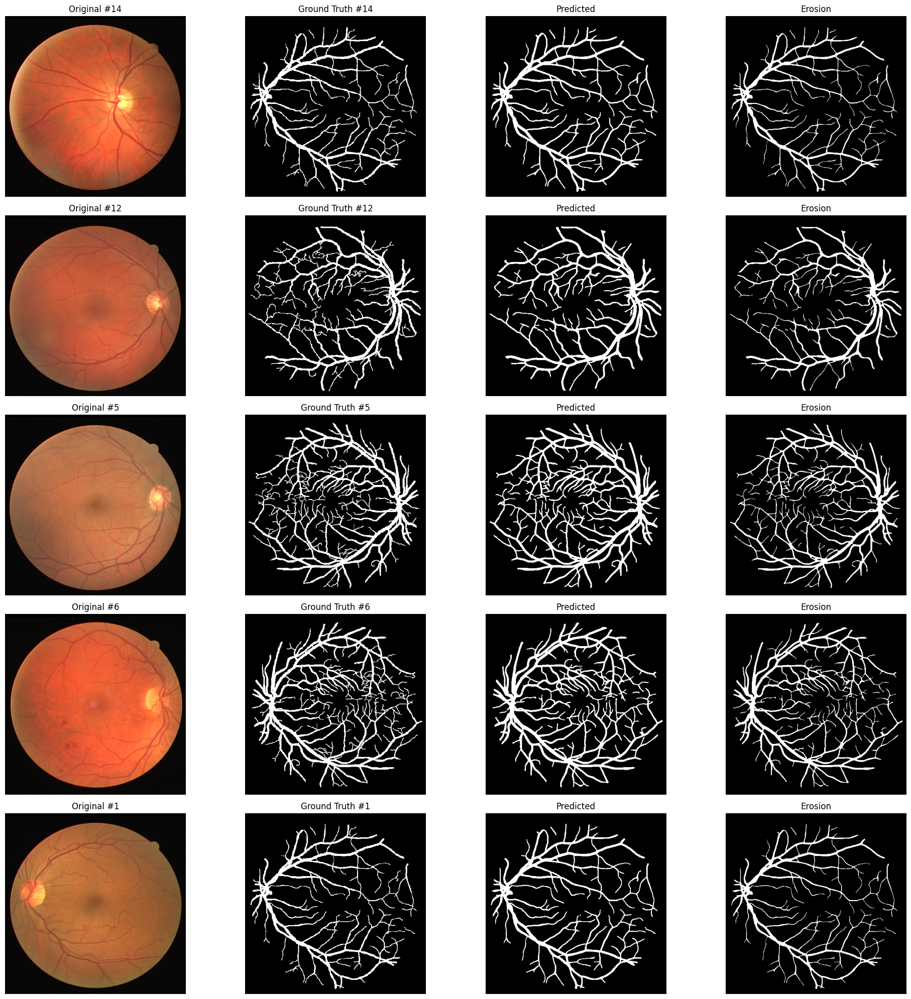

In [39]:
# 22) Visualization Predict
#===============================
def show_random_predictions(n=5):  
    test_files = sorted(os.listdir(test_images_path))
    total_images = len(test_images_processed)

    plt.figure(figsize=(20, n * 4))

    indices = random.sample(range(total_images), n)

    for count, i in enumerate(indices):
        # load original image
        #======================
        img_name = test_files[i]
        orig_img = cv2.imread(os.path.join(test_images_path, img_name))
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

        # Ground truth
        #======================
        mask = test_masks_processed[i]

        processed_img = test_images_processed[i]
        pred = model.predict(np.expand_dims(processed_img, axis=0))[0]
        pred = (pred > 0.5).astype(np.uint8)

        # pply morphology 
        #===================
        kernel = np.ones((2, 2), np.uint8)
        eroded = cv2.erode(pred.squeeze(), kernel, iterations=1)

        # Show Result
        #==================
        plt.subplot(n, 4, count*4 + 1)
        plt.imshow(orig_img)
        plt.title(f"Original #{i+1}")
        plt.axis("off")

        plt.subplot(n, 4, count*4 + 2)
        plt.imshow(mask.squeeze(), cmap="gray")
        plt.title(f"Ground Truth #{i+1}")
        plt.axis("off")

        plt.subplot(n, 4, count*4 + 3)
        plt.imshow(pred.squeeze(), cmap="gray")
        plt.title("Predicted")
        plt.axis("off")

        plt.subplot(n, 4, count*4 + 4)
        plt.imshow(eroded, cmap="gray")
        plt.title("Erosion")
        plt.axis("off")


    plt.tight_layout()
    plt.show()

show_random_predictions(5)